In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
audi = pd.read_csv('audi.csv')

In [3]:
audi.isnull().sum()

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
dtype: int64

In [4]:
audi.describe()

,year,price,mileage,tax,mpg,engineSize
count,10668.000000,10668.000000,10668.000000,10668.000000,10668.000000,10668.000000
mean,2017.100675,22896.685039,24827.244001,126.011436,50.770022,1.930709
std,2.167494,11714.841888,23505.257205,67.170294,12.949782,0.602957
min,1997.000000,1490.000000,1.000000,0.000000,18.900000,0.000000
25%,2016.000000,15130.750000,5968.750000,125.000000,40.900000,1.500000
50%,2017.000000,20200.000000,19000.000000,145.000000,49.600000,2.000000
75%,2019.000000,27990.000000,36464.500000,145.000000,58.900000,2.000000
max,2020.000000,145000.000000,323000.000000,580.000000,188.300000,6.300000


In [5]:
audi.head(10)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,A1,2017,12500,Manual,15735,Petrol,150,55.4,1.4
1,A6,2016,16500,Automatic,36203,Diesel,20,64.2,2.0
2,A1,2016,11000,Manual,29946,Petrol,30,55.4,1.4
3,A4,2017,16800,Automatic,25952,Diesel,145,67.3,2.0
4,A3,2019,17300,Manual,1998,Petrol,145,49.6,1.0
5,A1,2016,13900,Automatic,32260,Petrol,30,58.9,1.4
6,A6,2016,13250,Automatic,76788,Diesel,30,61.4,2.0
7,A4,2016,11750,Manual,75185,Diesel,20,70.6,2.0
8,A3,2015,10200,Manual,46112,Petrol,20,60.1,1.4
9,A1,2016,12000,Manual,22451,Petrol,30,55.4,1.4


In [6]:
audi['Series'] = audi.model.str.get(1)
audi['Series_Model'] = audi.model.str.get(-1)

Seperate the model to Series and Series_Model 

In [7]:
audi.head(10)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,Series,Series_Model
0,A1,2017,12500,Manual,15735,Petrol,150,55.4,1.4,A,1
1,A6,2016,16500,Automatic,36203,Diesel,20,64.2,2.0,A,6
2,A1,2016,11000,Manual,29946,Petrol,30,55.4,1.4,A,1
3,A4,2017,16800,Automatic,25952,Diesel,145,67.3,2.0,A,4
4,A3,2019,17300,Manual,1998,Petrol,145,49.6,1.0,A,3
5,A1,2016,13900,Automatic,32260,Petrol,30,58.9,1.4,A,1
6,A6,2016,13250,Automatic,76788,Diesel,30,61.4,2.0,A,6
7,A4,2016,11750,Manual,75185,Diesel,20,70.6,2.0,A,4
8,A3,2015,10200,Manual,46112,Petrol,20,60.1,1.4,A,3
9,A1,2016,12000,Manual,22451,Petrol,30,55.4,1.4,A,1


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


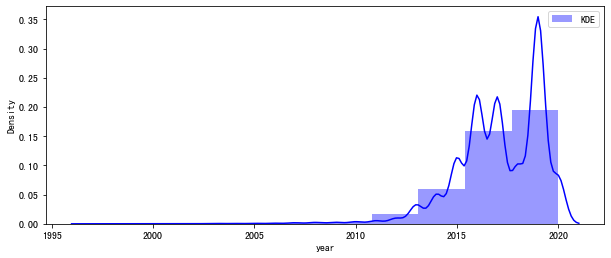

In [8]:
sns.distplot(audi['year'], bins = 10, color='blue', label='KDE')
plt.legend()
plt.gcf().set_size_inches(10, 4)

In [9]:
cat = ['model', 'transmission','fuelType']
for i in cat:
    print(f'{i} has {audi[i].nunique()} unique value:')
    print(audi[i].unique())
    print('-'*40)

model has 26 unique value:
[' A1' ' A6' ' A4' ' A3' ' Q3' ' Q5' ' A5' ' S4' ' Q2' ' A7' ' TT' ' Q7'
 ' RS6' ' RS3' ' A8' ' Q8' ' RS4' ' RS5' ' R8' ' SQ5' ' S8' ' SQ7' ' S3'
 ' S5' ' A2' ' RS7']
----------------------------------------
transmission has 3 unique value:
['Manual' 'Automatic' 'Semi-Auto']
----------------------------------------
fuelType has 3 unique value:
['Petrol' 'Diesel' 'Hybrid']
----------------------------------------


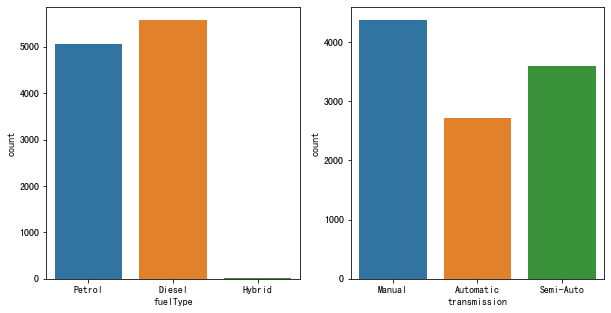

In [10]:
fig, ax =plt.subplots(1,2,figsize=(10,5))

sns.countplot(x = 'fuelType', data = audi, ax = ax[0])
sns.countplot(x = 'transmission', data = audi, ax = ax[1])
plt.show()

Series A are much more than others

Model A3 are the most popular car.

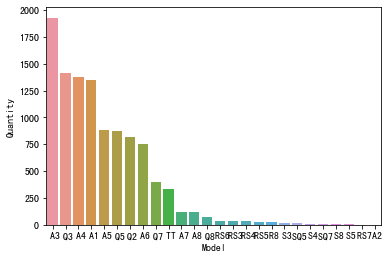

In [11]:
label = audi.model.value_counts().index
size = audi.model.value_counts()
#sns.countplot(x='model',data=audi)
sns.barplot(x = label, y = size)
plt.xlabel('Model')
plt.ylabel('Quantity')
plt.show()

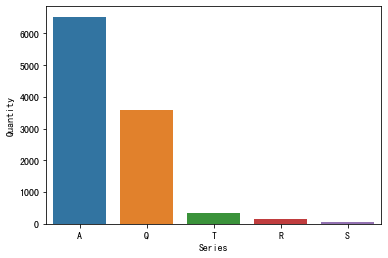

In [12]:
label = audi.Series.value_counts().index
size = audi.Series.value_counts()
#sns.countplot(x='model',data=audi)
sns.barplot(x = label, y = size)
plt.xlabel('Series')
plt.ylabel('Quantity')
plt.show()

We can learn a lot from charts below:

1.Series R has higher price than other series.

2.Series R has lower mpg than other series.

3.Series R has bigger engineSize than other series.

4.The year and the price have positive correlation, which means the newer the car, the higher the price.

5.The mileage and the price have negative correlation, which means the more the car drove, the lower the price had.

6.The engineSize and the price have positive correlation, which means the bigger the engineSize, the higher the price.

7.The mpg and the price have negative correlation, which means the higher the mpg, the lower the price.


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/textpath.py:84: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=LOAD_NO_HINTING)


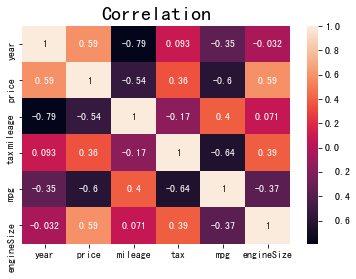

In [13]:
sns.heatmap(audi.corr(), annot = True)
plt.title('Correlation', size= 20)
plt.show()

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/textpath.py:84: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=LOAD_NO_HINTING)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


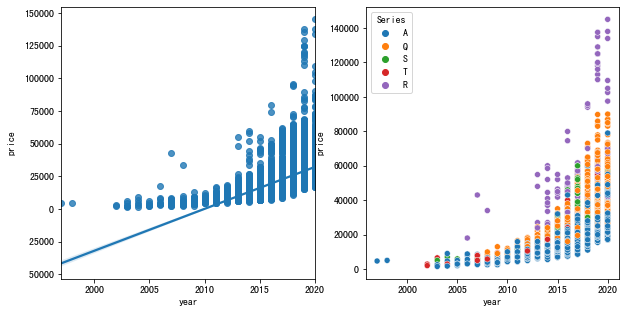

In [14]:
fig, ax =plt.subplots(1,2,figsize=(10,5))

sns.regplot(x = 'year', y = 'price', data = audi, ax=ax[0])
sns.scatterplot(x = 'year', y = 'price', data = audi, hue='Series', ax=ax[1])

plt.show()


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/textpath.py:84: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=LOAD_NO_HINTING)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


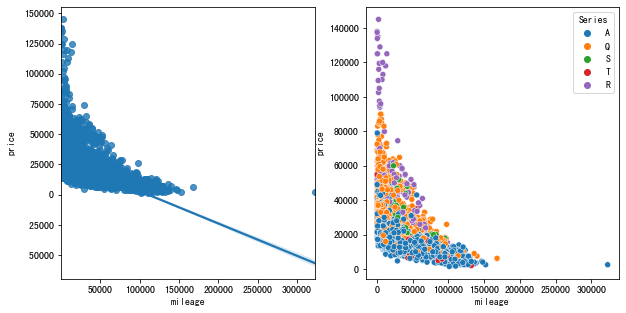

In [15]:
fig, ax =plt.subplots(1,2,figsize=(10,5))

sns.regplot(x = 'mileage', y = 'price', data = audi , ax = ax[0])
sns.scatterplot(x = 'mileage', y = 'price', data = audi, hue='Series', ax = ax[1])

plt.show()

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/textpath.py:84: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=LOAD_NO_HINTING)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


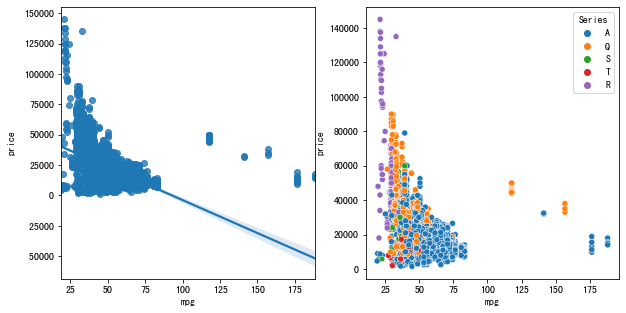

In [16]:
fig, ax =plt.subplots(1,2,figsize=(10,5))

sns.regplot(x = 'mpg', y = 'price', data = audi, ax = ax[0])
sns.scatterplot(x = 'mpg', y = 'price', data = audi, hue='Series', ax = ax[1])

plt.show()

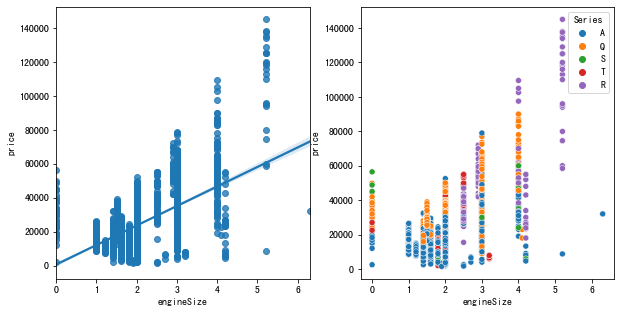

In [17]:
fig, ax =plt.subplots(1,2,figsize=(10,5))

sns.regplot(x = 'engineSize', y = 'price', data = audi, ax = ax[0])
sns.scatterplot(x = 'engineSize', y = 'price', data = audi, hue='Series', ax = ax[1])

plt.show()


#Encoding Categorical Data

Using One Hot Encoding

In [18]:
from sklearn.preprocessing import OneHotEncoder

In [19]:
enc = OneHotEncoder(handle_unknown='ignore')
audi_enc = audi.copy()

In [20]:
audi_enc = pd.get_dummies(audi_enc,columns=['model'],prefix='Model')
audi_enc = pd.get_dummies(audi_enc,columns=['transmission'],prefix='Transmission')
audi_enc = pd.get_dummies(audi_enc,columns=['fuelType'],prefix='Fuel')

In [21]:
audi_enc = audi_enc.drop(['Series','Series_Model'], axis=1)

In [22]:
audi_enc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10668 entries, 0 to 10667
Data columns (total 38 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   year                    10668 non-null  int64  
 1   price                   10668 non-null  int64  
 2   mileage                 10668 non-null  int64  
 3   tax                     10668 non-null  int64  
 4   mpg                     10668 non-null  float64
 5   engineSize              10668 non-null  float64
 6   Model_ A1               10668 non-null  uint8  
 7   Model_ A2               10668 non-null  uint8  
 8   Model_ A3               10668 non-null  uint8  
 9   Model_ A4               10668 non-null  uint8  
 10  Model_ A5               10668 non-null  uint8  
 11  Model_ A6               10668 non-null  uint8  
 12  Model_ A7               10668 non-null  uint8  
 13  Model_ A8               10668 non-null  uint8  
 14  Model_ Q2               10668 non-null

#Modeling

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor


In [24]:
train = audi_enc.drop(['price'],axis=1)
test = audi_enc['price']

In [25]:
x_train,x_test,y_train,y_test = train_test_split(train,test, test_size=0.2, random_state=5)
lr = LinearRegression()
lr.fit(x_train,y_train.values.ravel())
y_pred = lr.predict(x_test)
lr.score(x_train,y_train)


0.894999054145198

In [26]:
tree=DecisionTreeRegressor()
tree.fit(x_train,y_train)
y_pred = tree.predict(x_test)
tree.score(x_train,y_train)

0.9987731975725027